# UNIVERSITY HACK 2020 DATATHON

## MINDSAIT LAND CLASSIFICATION

### ÍNDICE

1. [Información](#INFORMACIÓN)
1. [Librerías](#LIBRERÍAS)
1. [Funciones previas](#FUNCIONES-PREVIAS)
1. [Importación y lectura de datos](#IMPORTACIÓN-Y-LECTURA-DE-DATOS)
1. [Análisis exploratorio e ingeniería de variables](#ANÁLISIS-EXPLORATORIO-E-INGENIERÍA-DE-VARIABLES)
    1. [EDA](#EDA)
    1. [PCA](#PCA)
    1. [Rotación](#ROTACIÓN-DE-LAS-VARIABLES-X-E-Y)
1. [Modelización](#MODELIZACIÓN)
    1. [Optimización](#OPTIMIZACIÓN-DE-HIPERPARÁMETROS)
    1. [Entrenamiento y predicción](#XGBOOST)
1. [Resultados](#RESULTADOS)
1. [Predicción](#PREDICCIÓN)
1. [Bibliografía](#BIBLIOGRAFÍA-Y-OTRAS-FUENTES-CONSULTADAS)

### INFORMACIÓN 

* __Equipo:__ MATRICS
    * Juan Villasante Guerrero
    * Miguel López Garralón
    * Beltrán Aller López


* __Centro:__ CUNEF


* __Coordinador:__ Juan Manuel López Zafra


* __Versión:__ 1.0

### LIBRERÍAS

In [690]:

# OPERACIONES BÁSICAS CON DATOS Y VISUALIZACIONES

import numpy as np 
import pandas as pd 
import random
random.seed(1234) # establecimiento de semilla para que los resultados sean replicables
from scipy import stats as sts # operaciones estadísticas básicas
import itertools 
import math
import seaborn as sns # visualizaciones
import matplotlib.pyplot as plt # visualizaciones
import pickle # para guardar los modelos

# FUNCIONES SCIKIT LEARN, REDUCCION DIMENSIONALIDAD, DIVISION Y MEDIDA DE RESULTADOS DEL MODELO

from sklearn import preprocessing
from sklearn.decomposition import PCA # análisis de componentes principales y rotación PCA
from sklearn.model_selection import train_test_split # división en train y test
from sklearn.metrics import roc_auc_score, roc_curve, auc, confusion_matrix, classification_report # resultados
from sklearn.model_selection import cross_val_score # cross validation
from sklearn.metrics import accuracy_score

# OPTMIZACION DE HIPERPARÁMETROS

from sklearn.model_selection import StratifiedKFold
from skopt import BayesSearchCV # optmización bayesiana

# MODELIZACION

import xgboost as xgb # algoritmo xgboost

from imblearn.over_sampling import SMOTE
from sklearn.metrics import recall_score
from sklearn.metrics import make_scorer
from imblearn.combine import SMOTETomek
from sklearn.base import BaseEstimator, TransformerMixin
import scipy.spatial
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.externals.joblib import Parallel, delayed
from scipy import sparse
from sklearn.cluster import DBSCAN
import plotly.express as px
from imblearn.pipeline import Pipeline

pesos = np.array([0.01491814, 0.16971811, 0.07304078, 0.05327909, 0.11721399,
       0.49646421, 0.07536569])

In [691]:
pd.set_option('display.max_columns', None)

### FUNCIONES PREVIAS

A continuación se definirán las funciones que serán usadas a lo largo de todo el notebook, son las siguientes:

* __conf_matrix:__ Recibe como parámetros los datos correpsondientes a la partes test y las predicciones llevadas acabo. El resultado de esta función es la matriz de confusión del modelo utilizado para la realización de las predicciones.

In [692]:
def conf_matrix(Y_test, Y_pred):
    labels = ['AGRICULTURE', 'INDUSTRIAL', 'OFFICE','OTHER','PUBLIC','RESIDENTIAL','RETAIL']
    cnf_matrix_tra = confusion_matrix(Y_test, Y_pred)
    conf_plot = sns.heatmap(cnf_matrix_tra, annot=True, cmap='Blues', fmt='g', xticklabels=labels, yticklabels=labels)
    bottom, top = conf_plot.get_ylim()
    conf_plot.set_ylim(bottom + 0.5, top - 0.5)
    conf_plot.set_title("Confusion matrix, without normalization")
    conf_plot.set_ylabel('True Label')
    conf_plot.set_xlabel('Predicted Label');

* __features_importence:__ La siguiente función recibe un único parámetro de entrada, los coeficientes obtenidos a través del proceso de entrenamiento del modelo. La salida es un gráfico de barras en el cual se puede ver el nivel de importancia atribuido por el modelo a cada una de las variables.

In [693]:
def features_importence(coeficients):
    data = {'Features':X_train.columns, 'Coeficients':abs(coeficients)} 
    coef = pd.DataFrame(data).sort_values(by=['Coeficients'], ascending=False)
    fig, ax = plt.subplots(figsize=(12,10))
    coef_plot = sns.barplot(coef['Features'],coef['Coeficients'])
    coef_plot.set_xticklabels(coef_plot.get_xticklabels(), rotation=40, ha="right");

* __ordinal:__ Se realiza un proceso de _ordinal encoding_ con la variable 'CADASTRALQUALITYID'. Acorde a la información facilitada por la organización del concurso donde se observa la relevancia y orden de cada uno de los valores observados en la variable, se atribuye a la categoría 'A' el valor 0, a la 'B' el valor 1 y a la 'C' el valor 2. El resto de categorías, las cuales son numéricas, ven incrementado su valor en dos unidades.

In [694]:
def ordinal(x):
    if x == 'A':
        return 0 # asignación del valor 0 a la categoría 'A'
    if x == 'B':
        return 1 # asignación del valor 1 a la categoría 'B'
    if x == 'C':
        return 2 # asignación del valor 2 a la categoría 'C'
    else:
        return int(x)+2 # incrementamos en dos unidades del resto de categorías

* __pca_coordinates:__ Esta función realiza una tranformación pca sobre las coordenadas del _dataset_.

In [695]:
def pca_coordinates(data):
    coordinates = data[['X','Y']].values
    pca_obj = PCA().fit(coordinates)
    pca_x = pca_obj.transform(data[['X', 'Y']])[:,0]
    pca_y = pca_obj.transform(data[['X', 'Y']])[:,1]
    return pca_x, pca_y

* __status_print:__ Va mostrando el estado de la optimización indicando los resultados conseguidos con los parámetros usados en cada iteración.

In [696]:
def status_print(optim_result):
    """Status callback durring bayesian hyperparameter search"""
    
    # Guardamos los modelos en un dataframe
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)    
    
    # Obtenemos los mejores parámetros    
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest Acc: {}\nBest params: {}\n'.format(
        len(all_models),
        np.round(bayes_cv_tuner.best_score_, 4),
        bayes_cv_tuner.best_params_
    ))
    
    # Guardamos los resultados en un csv
    clf_name = bayes_cv_tuner.estimator.__class__.__name__
    all_models.to_csv(clf_name+"_cv_results2.csv")

In [697]:
def my_metric(y_test, y_pred):
    pesos = np.array([0.01491814, 0.16971811, 0.07304078, 0.05327909, 0.11721399, 0.49646421, 0.07536569])
    metric = sum(recall_score(y_test,y_pred, average=None)*pesos)
    return metric
my_score = make_scorer(my_metric, greater_is_better=True)

### IMPORTACIÓN Y LECTURA DE DATOS

In [764]:
data_path_train = '../data/Modelar_UH2020.txt'
data = pd.read_csv(data_path_train, sep = "|")

In [699]:
data.head()

,ID,X,Y,Q_R_4_0_0,Q_R_4_0_1,Q_R_4_0_2,Q_R_4_0_3,Q_R_4_0_4,Q_R_4_0_5,Q_R_4_0_6,Q_R_4_0_7,Q_R_4_0_8,Q_R_4_0_9,Q_R_4_1_0,Q_G_3_0_0,Q_G_3_0_1,Q_G_3_0_2,Q_G_3_0_3,Q_G_3_0_4,Q_G_3_0_5,Q_G_3_0_6,Q_G_3_0_7,Q_G_3_0_8,Q_G_3_0_9,Q_G_3_1_0,Q_B_2_0_0,Q_B_2_0_1,Q_B_2_0_2,Q_B_2_0_3,Q_B_2_0_4,Q_B_2_0_5,Q_B_2_0_6,Q_B_2_0_7,Q_B_2_0_8,Q_B_2_0_9,Q_B_2_1_0,Q_NIR_8_0_0,Q_NIR_8_0_1,Q_NIR_8_0_2,Q_NIR_8_0_3,Q_NIR_8_0_4,Q_NIR_8_0_5,Q_NIR_8_0_6,Q_NIR_8_0_7,Q_NIR_8_0_8,Q_NIR_8_0_9,Q_NIR_8_1_0,AREA,GEOM_R1,GEOM_R2,GEOM_R3,GEOM_R4,CONTRUCTIONYEAR,MAXBUILDINGFLOOR,CADASTRALQUALITYID,CLASE
0,35984B9C3E7CD9A1,2207357872,165920300,0.000000,443.001300,616.001697,746.998401,872.996472,1009.000946,1159.002319,1342.002466,1572.003418,1943.686816,6512.787270,1.283357e-10,428.996347,574.000940,676.002960,778.003931,880.999176,997.000220,1130.001782,1311.997949,1626.996155,8627.098641,155.003632,402.000092,458.999939,510.000061,567.999939,632.000610,681.000916,726.109186,791.000269,902.999719,1980.172280,0.000013,892.016479,1244.014185,1497.998303,1731.204688,1944.003906,2160.996533,2410.995264,2719.999756,3180.000342,10951.926645,144.426900,0.557237,0.067249,0.057372,0.853127,2002,0.0,2,RESIDENTIAL
1,F9D04BF6D037F8FB,2189757160,165463267,0.000059,443.899011,627.999060,770.001611,904.999988,1032.998474,1165.001636,1316.000110,1505.990771,1804.993469,6269.935600,1.352518e-11,433.998392,565.000110,662.996521,746.001318,828.998413,912.000330,1011.997162,1142.202637,1384.994580,5357.790999,120.000275,419.000000,472.999939,509.999808,541.999976,572.000000,602.999939,636.000122,673.000122,745.000000,3647.195402,0.000030,846.002728,1139.006982,1363.993860,1558.000513,1749.993713,1956.000464,2194.001978,2507.001416,3012.991675,7048.367637,38.342550,0.709884,0.125156,0.147929,1.181953,1949,1.0,8,RESIDENTIAL
2,B89D5711AFF8C423,2240147335,165690752,0.000000,353.502274,523.003601,644.001831,760.997131,876.999634,1006.997498,1168.995544,1375.008179,1719.003235,5010.767611,0.000000e+00,379.001587,507.003815,600.000519,684.000488,768.997528,867.001587,992.991760,1165.998413,1443.000366,5240.232771,83.000389,363.000031,429.002502,473.000015,510.000092,549.000244,590.999939,635.999817,692.999817,796.498779,1947.739721,0.000005,807.001373,1124.002441,1365.009583,1570.995117,1768.992798,1978.989258,2228.999146,2561.999756,3088.000488,7013.073271,108.794384,0.517702,0.058268,0.081666,1.401552,1986,1.0,5,RESIDENTIAL
3,1C3478AC1522E7E4,2227146459,165934099,0.000000,268.000613,376.999609,478.003784,575.001233,683.997742,809.005994,955.002960,1136.997144,1447.997290,5465.430281,6.341585e-06,310.999088,405.998712,485.000607,558.997925,641.001007,731.994189,838.004376,974.797485,1217.996167,5343.168796,0.001450,256.999487,295.999969,329.000092,366.000043,411.000549,457.000061,506.000000,565.999817,663.999817,1424.396092,0.002285,1200.994470,1476.001294,1678.005042,1848.001782,2022.988464,2211.993506,2433.003687,2740.996582,3349.986328,6216.880538,155.224455,0.450871,0.053591,0.054201,1.011382,1999,1.0,2,RESIDENTIAL
4,4D12AA5009064345,2212350459,165681791,0.000000,318.997910,492.003845,632.999634,757.002197,882.999908,1019.008911,1175.993103,1401.000488,1756.994141,7376.529218,0.000000e+00,284.000534,421.002472,526.003815,618.998779,705.999268,801.005432,912.999451,1069.996094,1348.497314,7460.394534,193.000626,431.505035,462.999939,492.000061,519.000427,547.000061,578.999878,617.999603,662.999939,750.000488,1940.403140,0.000000,529.004425,790.996704,999.001617,1183.995239,1355.992920,1535.998779,1725.498962,1954.991455,2315.991455,7092.767616,1789.873366,0.458819,0.012858,0.019936,1.550478,1966,8.0,6,RESIDENTIAL


Realizamos un `datos.info()` y un `datos.head()` para observar el tipo de los datos y tener un primer vistazo de estos.

In [700]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103230 entries, 0 to 103229
Data columns (total 56 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   ID                  103230 non-null  object 
 1   X                   103230 non-null  int64  
 2   Y                   103230 non-null  int64  
 3   Q_R_4_0_0           103230 non-null  float64
 4   Q_R_4_0_1           103230 non-null  float64
 5   Q_R_4_0_2           103230 non-null  float64
 6   Q_R_4_0_3           103230 non-null  float64
 7   Q_R_4_0_4           103230 non-null  float64
 8   Q_R_4_0_5           103230 non-null  float64
 9   Q_R_4_0_6           103230 non-null  float64
 10  Q_R_4_0_7           103230 non-null  float64
 11  Q_R_4_0_8           103230 non-null  float64
 12  Q_R_4_0_9           103230 non-null  float64
 13  Q_R_4_1_0           103230 non-null  float64
 14  Q_G_3_0_0           103230 non-null  float64
 15  Q_G_3_0_1           103230 non-nul

Como podemos observar el archivo se compone de 55 variables independientes. De estas 55 variables tenemos 4 variables categóricas `ID`, `CONTRUCTIONYEAR`, `MAXBUILDINGFLOOR` y `CADASTRALQUALITYID`, siendo esta última la única que hace falta transformar a valores numéricos.

Para resolver el problema que nos interesa, la variable asociada al identificador, `datos['ID']`; no nos aporta utilidad alguna. Por tanto, la eliminamos.

In [701]:
data.drop(['ID'], axis = 1, inplace = True)

### ANÁLISIS EXPLORATORIO E INGENIERÍA DE VARIABLES

#### EDA

Procedemos a visualizar el número de clases que componen nuestro _target_.

In [702]:
data['CLASE'].unique()

array(['RESIDENTIAL', 'INDUSTRIAL', 'PUBLIC', 'OFFICE', 'OTHER', 'RETAIL',
       'AGRICULTURE'], dtype=object)

Se observa que el _target_ está formado por 7 clases distintas:
* RESIDENTIAL
* INDUSTRIAL
* PUBLIC
* OFFICE
* OTHER
* RETAIL
* AGRICULTURE

El siguiente paso es ver el número de observaciones pertenecientes a cada clase.

In [703]:
data['CLASE'].value_counts()

RESIDENTIAL    90173
INDUSTRIAL      4490
PUBLIC          2976
RETAIL          2093
OFFICE          1828
OTHER           1332
AGRICULTURE      338
Name: CLASE, dtype: int64

Observamos que el dataset está fuertemente desbalanceado, este ha tenido gran relevancia a la hora de tomar ciertas decisiones tanto en el proceso de feature engineering como en el modelado

Representamos los registros gráficamente mediante las coordenadas X e Y.

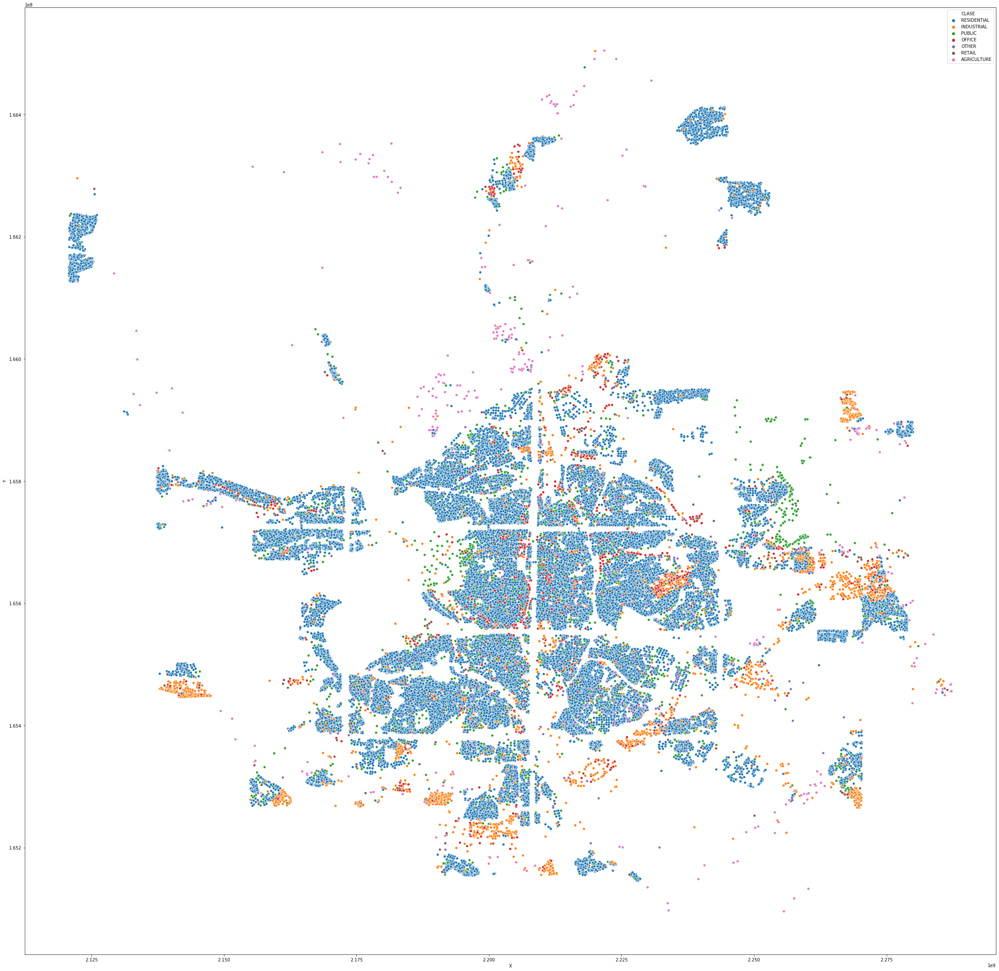

In [704]:
plt.figure(figsize=(40, 40))
sns.scatterplot(x='X', y='Y', data=data, hue= data.CLASE);

Podemos observar como se distingue claramente la ciudad de Madrid y alrededores, apreciandose la concentración de ciertas clases del target en varias zonas de Madrid. Es por esto que consideramos las coordenadas como una variable importante y decidimos incluirlas en la modelización.

A lo largo de la carga de archivos surge la duda acerca de si se da la existencia de valores nulos o faltantes, lo comprobamos.

In [705]:
data.isnull().sum()

X                      0
Y                      0
Q_R_4_0_0              0
Q_R_4_0_1              0
Q_R_4_0_2              0
Q_R_4_0_3              0
Q_R_4_0_4              0
Q_R_4_0_5              0
Q_R_4_0_6              0
Q_R_4_0_7              0
Q_R_4_0_8              0
Q_R_4_0_9              0
Q_R_4_1_0              0
Q_G_3_0_0              0
Q_G_3_0_1              0
Q_G_3_0_2              0
Q_G_3_0_3              0
Q_G_3_0_4              0
Q_G_3_0_5              0
Q_G_3_0_6              0
Q_G_3_0_7              0
Q_G_3_0_8              0
Q_G_3_0_9              0
Q_G_3_1_0              0
Q_B_2_0_0              0
Q_B_2_0_1              0
Q_B_2_0_2              0
Q_B_2_0_3              0
Q_B_2_0_4              0
Q_B_2_0_5              0
Q_B_2_0_6              0
Q_B_2_0_7              0
Q_B_2_0_8              0
Q_B_2_0_9              0
Q_B_2_1_0              0
Q_NIR_8_0_0            0
Q_NIR_8_0_1            0
Q_NIR_8_0_2            0
Q_NIR_8_0_3            0
Q_NIR_8_0_4            0


Se observan 20 registros nulos correspondientes a las variables `MAXBUILDINGFLOOR` y `CADASTRALQUALITYID`. Que el número coincida nos hace pensar que pueden tratarse de los mismos registros. Se procede al estudio de estos.

In [706]:
data[data['MAXBUILDINGFLOOR'].isnull()].equals(data[data['CADASTRALQUALITYID'].isnull()])

True

Observamos que se tratan de los mismos registros.

In [707]:
# Distribución de la clase asociada a los NaN

data[data['MAXBUILDINGFLOOR'].isnull()].groupby(['CLASE'])[['CLASE']].count()

,CLASE
CLASE,
AGRICULTURE,15
INDUSTRIAL,4
RETAIL,1


Como podemos observar, el 75% de los NAs corresponden a la categoría `AGRICULTURE`. Decidimos utilizar sus estadísticos en la imputacion de valores nulos

In [708]:
data[data['CLASE'].map(lambda x: x in['AGRICULTURE', 'INDUSTRIAL','RETAIL'])].groupby('CLASE').agg({'MAXBUILDINGFLOOR':'describe','CADASTRALQUALITYID':'describe'})

MAXBUILDINGFLOOR                                                \
                       count      mean       std  min  25%  50%  75%   max   
CLASE                                                                        
AGRICULTURE            323.0  2.501548  3.051702  0.0  1.0  1.0  2.5  17.0   
INDUSTRIAL            4486.0  4.035444  3.881447  0.0  1.0  2.0  6.0  25.0   
RETAIL                2092.0  5.466539  3.660422  0.0  3.0  5.0  7.0  25.0   

            CADASTRALQUALITYID                   
                         count unique top  freq  
CLASE                                            
AGRICULTURE                323      8   7   114  
INDUSTRIAL                4486     11   5  1260  
RETAIL                    2092     12   6   649

Dada la desviación estándar observada en la variable `MAXBUILDINGFLOOR`, se optará por imputar los valores `NaN`a través de la mediana. 
En el caso de la variable `CADASTRALQUALITY`, por ser esta de naturaleza categórica, optamos por imputar por la moda.

In [709]:
data['MAXBUILDINGFLOOR'].fillna(1, inplace=True)
data['CADASTRALQUALITYID'].fillna('7', inplace=True)

Observamos el número de categorías por las que está formada la variable `CADASTRALQUALITYID`. Decidimos realizar un proceso de _ordinal encoding_ con el objeto de que la variable resulte más manejable y entendible. Llevamos acabo el proceso atendiendo al orden natural de preferencia de la variable explicado en la información facilitada por la organización.

In [710]:
# Variable categórica, decido realizar ordinal encoding (A<B<C<1...<9)

data.CADASTRALQUALITYID.unique()

array(['2', '8', '5', '6', '4', '7', '3', 'C', '1', '9', 'B', 'A'],
      dtype=object)

In [711]:
data['CADASTRALQUALITYID'] = data['CADASTRALQUALITYID'].apply(lambda x: ordinal(x))

Comprobamos de nuevo las categorías correspondientes a la variable `CADASTRALQUALITYID`.

In [712]:
data.CADASTRALQUALITYID.unique()

array([ 4, 10,  7,  8,  6,  9,  5,  2,  3, 11,  1,  0], dtype=int64)

Dividimos el _dataset_ diferenciando nuestra variable _target_ de las variables independientes.

In [713]:
X = data.loc[:, data.columns != 'CLASE']
Y = data['CLASE']

In [714]:
X.head()

,X,Y,Q_R_4_0_0,Q_R_4_0_1,Q_R_4_0_2,Q_R_4_0_3,Q_R_4_0_4,Q_R_4_0_5,Q_R_4_0_6,Q_R_4_0_7,Q_R_4_0_8,Q_R_4_0_9,Q_R_4_1_0,Q_G_3_0_0,Q_G_3_0_1,Q_G_3_0_2,Q_G_3_0_3,Q_G_3_0_4,Q_G_3_0_5,Q_G_3_0_6,Q_G_3_0_7,Q_G_3_0_8,Q_G_3_0_9,Q_G_3_1_0,Q_B_2_0_0,Q_B_2_0_1,Q_B_2_0_2,Q_B_2_0_3,Q_B_2_0_4,Q_B_2_0_5,Q_B_2_0_6,Q_B_2_0_7,Q_B_2_0_8,Q_B_2_0_9,Q_B_2_1_0,Q_NIR_8_0_0,Q_NIR_8_0_1,Q_NIR_8_0_2,Q_NIR_8_0_3,Q_NIR_8_0_4,Q_NIR_8_0_5,Q_NIR_8_0_6,Q_NIR_8_0_7,Q_NIR_8_0_8,Q_NIR_8_0_9,Q_NIR_8_1_0,AREA,GEOM_R1,GEOM_R2,GEOM_R3,GEOM_R4,CONTRUCTIONYEAR,MAXBUILDINGFLOOR,CADASTRALQUALITYID
0,2207357872,165920300,0.000000,443.001300,616.001697,746.998401,872.996472,1009.000946,1159.002319,1342.002466,1572.003418,1943.686816,6512.787270,1.283357e-10,428.996347,574.000940,676.002960,778.003931,880.999176,997.000220,1130.001782,1311.997949,1626.996155,8627.098641,155.003632,402.000092,458.999939,510.000061,567.999939,632.000610,681.000916,726.109186,791.000269,902.999719,1980.172280,0.000013,892.016479,1244.014185,1497.998303,1731.204688,1944.003906,2160.996533,2410.995264,2719.999756,3180.000342,10951.926645,144.426900,0.557237,0.067249,0.057372,0.853127,2002,0.0,4
1,2189757160,165463267,0.000059,443.899011,627.999060,770.001611,904.999988,1032.998474,1165.001636,1316.000110,1505.990771,1804.993469,6269.935600,1.352518e-11,433.998392,565.000110,662.996521,746.001318,828.998413,912.000330,1011.997162,1142.202637,1384.994580,5357.790999,120.000275,419.000000,472.999939,509.999808,541.999976,572.000000,602.999939,636.000122,673.000122,745.000000,3647.195402,0.000030,846.002728,1139.006982,1363.993860,1558.000513,1749.993713,1956.000464,2194.001978,2507.001416,3012.991675,7048.367637,38.342550,0.709884,0.125156,0.147929,1.181953,1949,1.0,10
2,2240147335,165690752,0.000000,353.502274,523.003601,644.001831,760.997131,876.999634,1006.997498,1168.995544,1375.008179,1719.003235,5010.767611,0.000000e+00,379.001587,507.003815,600.000519,684.000488,768.997528,867.001587,992.991760,1165.998413,1443.000366,5240.232771,83.000389,363.000031,429.002502,473.000015,510.000092,549.000244,590.999939,635.999817,692.999817,796.498779,1947.739721,0.000005,807.001373,1124.002441,1365.009583,1570.995117,1768.992798,1978.989258,2228.999146,2561.999756,3088.000488,7013.073271,108.794384,0.517702,0.058268,0.081666,1.401552,1986,1.0,7
3,2227146459,165934099,0.000000,268.000613,376.999609,478.003784,575.001233,683.997742,809.005994,955.002960,1136.997144,1447.997290,5465.430281,6.341585e-06,310.999088,405.998712,485.000607,558.997925,641.001007,731.994189,838.004376,974.797485,1217.996167,5343.168796,0.001450,256.999487,295.999969,329.000092,366.000043,411.000549,457.000061,506.000000,565.999817,663.999817,1424.396092,0.002285,1200.994470,1476.001294,1678.005042,1848.001782,2022.988464,2211.993506,2433.003687,2740.996582,3349.986328,6216.880538,155.224455,0.450871,0.053591,0.054201,1.011382,1999,1.0,4
4,2212350459,165681791,0.000000,318.997910,492.003845,632.999634,757.002197,882.999908,1019.008911,1175.993103,1401.000488,1756.994141,7376.529218,0.000000e+00,284.000534,421.002472,526.003815,618.998779,705.999268,801.005432,912.999451,1069.996094,1348.497314,7460.394534,193.000626,431.505035,462.999939,492.000061,519.000427,547.000061,578.999878,617.999603,662.999939,750.000488,1940.403140,0.000000,529.004425,790.996704,999.001617,1183.995239,1355.992920,1535.998779,1725.498962,1954.991455,2315.991455,7092.767616,1789.873366,0.458819,0.012858,0.019936,1.550478,1966,8.0,8


Las variables que empiezan por la letra 'Q' corresponden a los deciles de los 4 canales RGB-NIR de la imagen previamente preprocesados en el concurso. Ejemplo: 'Q_R_4_0_7' representa al color rojo y el decil 7. Realizaremos a partir de estos datos un proceso de _feature creation_ en el cual generaremos una nueva variable que se corresponderán con la media de la saturación mediana de la imagen.

In [715]:
X['RGB']= (X.Q_R_4_0_5 + X.Q_G_3_0_5 + X.Q_B_2_0_5 + X.Q_NIR_8_0_5)/4

### TRATAMIENDO CANALES RGB-NIR

En el _dataset_ se dispone de 44 variables asociadas a los valores de los canales RGB-NIR en sus correspondientes deciles, con el objetivo de agilizar el cómputo de los algoritmo que serán calculados, realimos un proceso de reducción de la dimensión para compactar la información relevante eliminando el ruido que las variables pudieran introducir en el modelado. Para la reducción de la dimensión hemos aplicado un análisis de componentes principales y una autoencoder convolucional. 

Resultó dificil distinguir cual de las dos técnicas resultó tener un mayor rendimiento, por lo que decidimos incorportar las información extraida de ambas técnicas viendo que esto no era perjudicial para el modelo.

En el proyecto se intentó reducir la dimensión con PCA y diferentes kernels, sin embargo, para la ejecución de los cálculos eran necesarios 80GB de memoria RAM impidiendonos realizar dichas pruebas.

#### PCA

En un primer momento no estableceremos un límite al número de componentes, puesto que a priori, no sabemos cuál será el número óptimo que nos permita reducir la dimensión al máximo perdiendo la menor información posible.

In [716]:
# generación del análisis PCA

pca = PCA()
pca_variables = pca.fit_transform(X.loc[:, 'Q_R_4_0_0':'Q_NIR_8_1_0'])

Una vez realizado en _PCA_ sobre las variables mencionadas, mostramos el porcentaje de varianza explicada por cada uno de los componentes calculados.

In [717]:
# se guardan los resultados en un dataframe para facilitar su posterior reproducción

explained_variance_df = pd.DataFrame(pca.explained_variance_ratio_, columns=['Porcentaje de varianza explicada'])

Graficamos el porcentaje de varianza explicada de los 8 primeros componentes, escogemos 8 de manera arbitraria, se trata de una primera visualización.

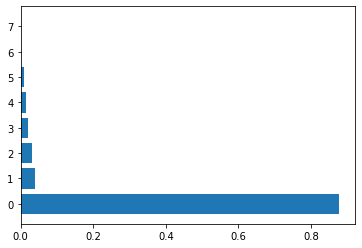

In [718]:
height = explained_variance_df['Porcentaje de varianza explicada'][0:8]
bars = explained_variance_df.index.values[0:8]
y_pos = np.arange(len(bars))
plt.barh(y_pos, height)
plt.show()

In [719]:
# dataframe con la varianza explicada

explained_variance_df.head(8)

,Porcentaje de varianza explicada
0,0.877911
1,0.041060
2,0.031674
3,0.020972
4,0.015379
5,0.009017
6,0.001682
7,0.001338


Parece ser que son los 5 primeros componentes los que explican la varianza sino en su totalidad, en gran medida. Sobretodo el primero.

In [720]:
# Con 5 componentes principales obtengo el 98.7% de la varianza

explained_variance_df.iloc[0:5].sum()

Porcentaje de varianza explicada    0.986996
dtype: float64

Una vez definido el número óptimo de componentes como 5, procedemos a la realización de un nuevo análisis de componentes principales especificando el valor del parámetro correspondiente a los componentes, `n_components`.

In [721]:
pca = PCA(n_components=5)
channels = pca.fit_transform(X.loc[:, 'Q_R_4_0_0':'Q_NIR_8_1_0'])
channels = pd.DataFrame(channels, columns = [f'COMPONENT_{i+1}' for i in range(5)])

Elimino las variables al ser reemplazadas estas por los componentes principales.
Además de la eliminación de los 4 canales de color, eliminamos la variable `GEOM_R4` puesto que los modelos probados aparte no la consideraban relevante.

In [722]:
X.drop(X.columns[2:46],axis=1, inplace=True)
X.drop('GEOM_R4',axis=1, inplace=True)

A continuación procedemos al estudio de las correlaciones entre las variables independientes que nos quedan en el _dataset_.

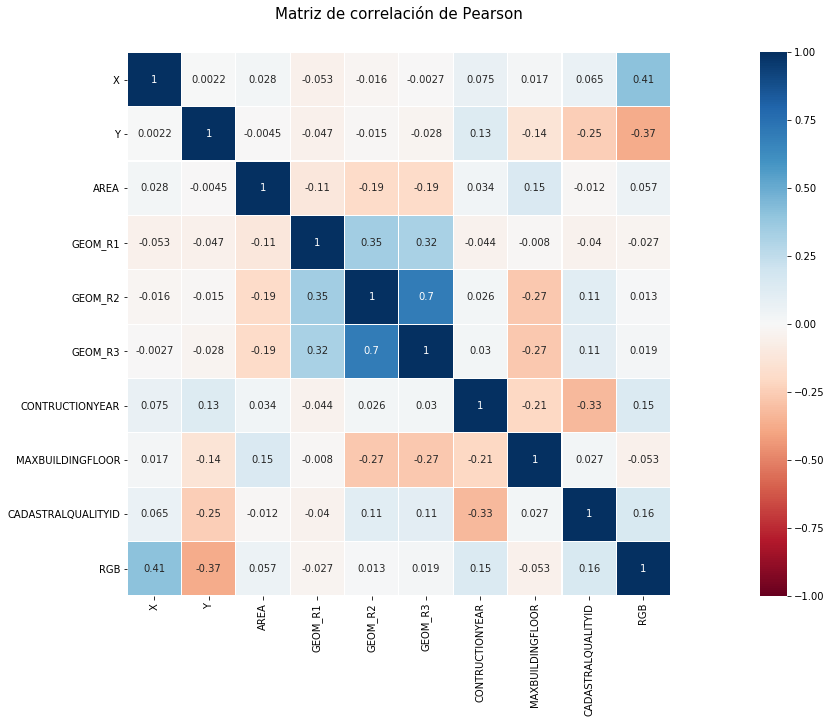

In [723]:
colormap = plt.cm.RdBu
plt.figure(figsize=(32,10))
plt.title('Matriz de correlación de Pearson', y=1.05, size=15)
sns.heatmap(X.corr(),linewidths=0.1,vmax=1.0, vmin=-1,
            square=True, cmap=colormap, linecolor='white', annot=True);

Observamos una alta correlación entre las variable de tipo `GEOM_RX`, sin embargo, en pruebas posteriores tanto la reduccion dimensional como la eliminación de alguna de estas no genera mejoras en los modelos.

#### AUTOENCODER CONVOLUCIONAL

El procesamiento mediante redes convolucionales se ha realizado en un notebook adjunto en el proyecto. Una vez extraida la información se guarda en un csv para incorporarlas a continuación

In [724]:
encoder = pd.read_csv('../data/encoders.txt', sep = "|")

In [725]:
# Se unen las variables generadas por el PCA y por el autoencoder

X =  pd.concat([channels, encoder, X], axis = 1) 

### ROTACIÓN DE LAS VARIABLES X E Y

El algoritmo elegido finalmente para el modelado se trata de XGBoost, este tipo de algoritmos basados en árboles de decisión se ven beneficiados de la rotación del eje de coordenadas, esto permite al algoritmo dividir eficazmente las calles del mapa (un único split en lugar de multiples cortes pequeños)

Para rotar las coordenadas debemos estandarizarlas. La estandarización la realizaremos mediante el método de normalización estándar incluido en la librería `scikitlearn`, a través del uso de la función `StandardScaler`. La fórmula es la siguiente:

$$\frac{x - \overline{x}}{s}$$

El valor observado menos la media y partido por la desviación estándar.

In [726]:
# estandarización de las coordenadas

xyscaler=preprocessing.StandardScaler() 
xyscaler.fit(X[["X","Y"]])
X[["X","Y"]]=xyscaler.transform(X[["X","Y"]]) 

Relativo a la rotación de las coordenadas ya estadanrizadas, se ha aplicado una rotación de 15, 30, 45, 60, y 75 grados así como la generación de la variable radial, variable que calcula la distancia del centro del mapa a todos los puntos. También se ha llevado a cabo otra técnica en la que se utiliza rotación PCA. En el modelo se incluyen todas las variables rotadas y las originales.

In [727]:
for degree in [15,30,45,60,75]:
    X[f"ROT{degree}X"] = math.cos(math.radians(degree)) * X["Y"] + math.sin(math.radians(degree)) * X["X"] 
    X[f"ROT{degree}Y"] = math.cos(math.radians(degree)) * X["Y"] - math.sin(math.radians(degree)) * X["X"]

In [728]:
X["RADIAL"] = np.sqrt(np.power(X["Y"], 2) + np.power(X["X"], 2))

In [729]:
# pca sobre las coordenadas

def pca_coordinates(data):
    coordinates = data[['X','Y']].values
    pca_obj = PCA().fit(coordinates)
    pca_x = pca_obj.transform(data[['X', 'Y']])[:,0]
    pca_y = pca_obj.transform(data[['X', 'Y']])[:,1]
    return pca_x, pca_y

pca_x, pca_y = pca_coordinates(X)

In [730]:
X['PCA_X'] = pca_x
X['PCA_Y'] = pca_y

Observamos la forma que adoptan los datos una vez hecho todo el proceso de _data engineering_.

### VARIABLES EN BASE A SU POSICIÓN RELATIVA

La idea de generación de estas variables está basada en que su posición relativa es de gran importancia a la hora de identificar que tipo de clase se trata, en la visualización del mapa de puntos podemos ver como los registros pertenecientes `AGRICULTURE`están mucho más espaciados que los residenciales. La idea es establecér nuevas variables con la entrada de un nuevo registro en base a su posición relativa con los ya existentes, esto se hace generando un modelo dinámico en el las variables han de recalcularse con la incorporación de nuevos registros.

La primera variable generada es la densidad de la zona en la que se encuentra el registro, para ellos hemos calculado la distancia media de los 5 vecinos al propio punto.

In [731]:
# Obtenemos las distancias y registros de los 5 vecinos más cercanos

kdt = scipy.spatial.cKDTree(X[['X','Y']]) 
k = 5
dists, neighs = kdt.query(X[['X','Y']], k+1)

In [732]:
# Variable con la distancia media a los 5 vecinos

avg_dists = np.mean(dists[:, 1:], axis=1)

In [733]:
X["DENSITY"] = avg_dists

También se crean otras dos variables con la mediana del area y la moda de la altura de los 15 vecinos.

In [734]:
kdt = scipy.spatial.cKDTree(X[['X','Y']]) 
k = 15
dists, neighs = kdt.query(X[['X','Y']], k+1)

In [735]:
neighs

array([[     0,  42647,  60439, ...,  82079,  94554,    182],
       [     1,  56212,  11119, ..., 100636,  46151,  89245],
       [     2,  76014,  55968, ...,   8000,  81156,  13396],
       ...,
       [103227,  56187,  74804, ...,  53984,  72347,  73045],
       [103228,   5141,  54082, ...,  90933,  17523,  95892],
       [103229,  25651,  80690, ...,  50190,   5154,  96779]])

In [736]:
# Nos quedamos con los índices de los vecinos

neighs = neighs[:, 1:]

Guardo en una lista las modas de altura de los 15 vecinos. Como la moda puede ser mas de un valor, decido quedarme únicamente con la moda de menor altura.

In [737]:
mode_build_floor = []
for i in range(neighs.shape[0]):
    mode_build_floor.append(X.loc[neighs[i], 'MAXBUILDINGFLOOR'].mode().values[0])

In [738]:
mode_build_floor = np.array(mode_build_floor)
X['MODE_BUILD_FLOOR'] = mode_build_floor

Realizo el mismo procedimiento pero con la mediana del area de los 15 vecinos.

In [739]:
median_area = []
for i in range(neighs.shape[0]):
    median_area.append(X.loc[neighs[i], 'AREA'].median())

In [740]:
median_area = np.array(median_area)
X['MEDIAN_AREA'] = median_area

Como última variable decidimos generar barrios en base a la densidad de puntos en el mapa, Esta variable es considerada de gran relevancia por el algoritmo, sin embargo la mejora en accuracy con su incorporación es muy ligera. 

La principa conclusión a la que hemos llegado es que la generacion de estos barrios ayuda en gran medida al algoritmo a decidir la clase de los registros sin aportar nueva información realmente útil. 

Para la generación de los clusters se utiliza el algoritmo DBSCAN.

In [741]:
kms_per_radian = 6371.0088
epsilon = 2 / kms_per_radian

In [742]:
# epsilon = 0.00035392202754452326
# min_samples=8

In [743]:
# Ajuste de epsilon a la distancia adecuada
epsilon = 0.00040392202754452326

In [744]:
%%time
db = DBSCAN(eps=epsilon, min_samples=8, algorithm= 'ball_tree', metric= 'haversine').fit(np.radians(X[['X','Y']]))

Wall time: 13.2 s


In [745]:
# numero de clusters
len(np.unique(db.labels_))

196

In [746]:
X['NEIGHBORHOOD'] = db.labels_

Podemos visualizar los barrios creados a continuación

In [747]:
fig = px.scatter(x=X.X, y=X.Y, color=db.labels_, width=800, height=800)
fig.show()

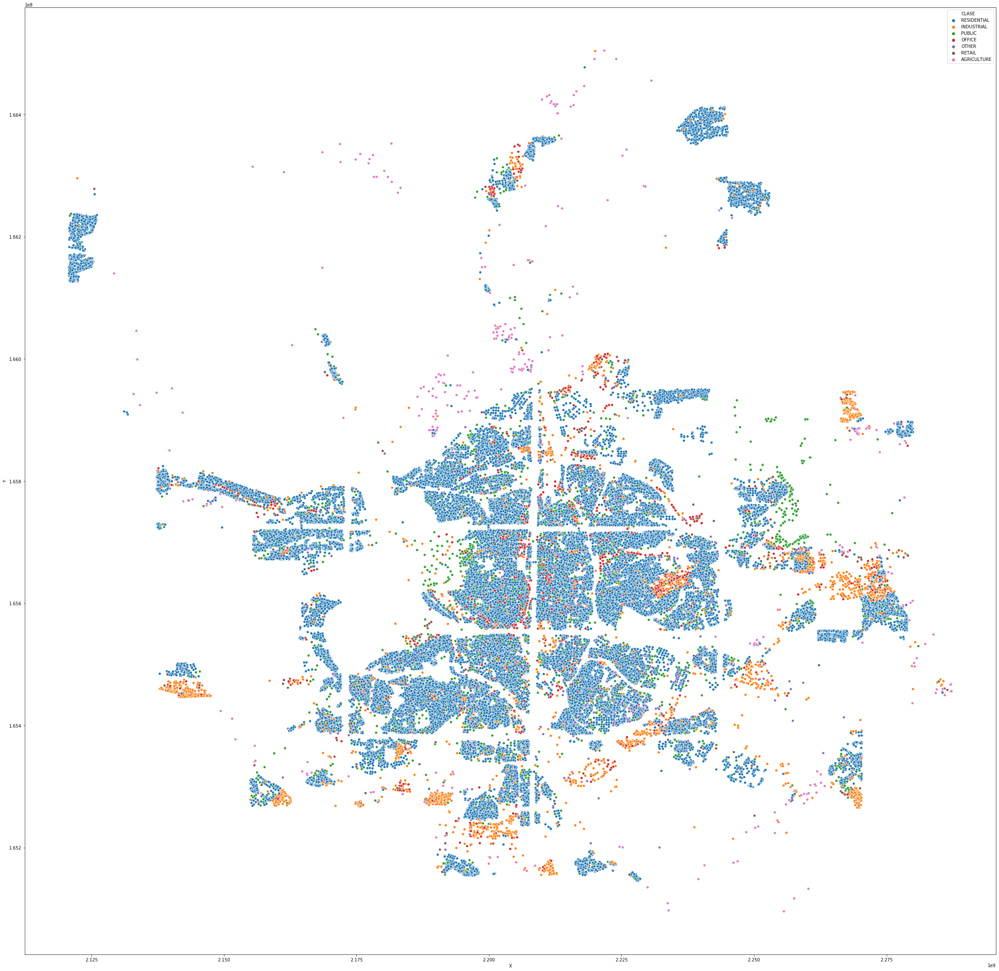

In [748]:
plt.figure(figsize=(40, 40))
sns.scatterplot(x='X', y='Y', data=datos, hue= datos.CLASE);

Observamos la forma que adoptan los datos una vez hecho todo el proceso de _data engineering_.

In [749]:
X.head()

,COMPONENT_1,COMPONENT_2,COMPONENT_3,COMPONENT_4,COMPONENT_5,b,c,X,Y,AREA,GEOM_R1,GEOM_R2,GEOM_R3,CONTRUCTIONYEAR,MAXBUILDINGFLOOR,CADASTRALQUALITYID,RGB,ROT15X,ROT15Y,ROT30X,ROT30Y,ROT45X,ROT45Y,ROT60X,ROT60Y,ROT75X,ROT75Y,RADIAL,PCA_X,PCA_Y,DENSITY,MODE_BUILD_FLOOR,MEDIAN_AREA,NEIGHBORHOOD
0,2014.093467,-1822.742583,-2310.110626,945.421189,133.912039,2.293186,2.925677,-0.054524,1.592035,144.426900,0.557237,0.067249,0.057372,2002,0.0,4,1116.501160,1.523676,1.551900,1.351481,1.406005,1.087185,1.164293,0.748799,0.843237,0.359383,0.464715,1.592969,1.087185,1.164293,0.005457,1.0,161.648783,0
1,-2066.257214,1133.747506,-807.334422,162.489469,-742.562297,1.952058,2.921762,-0.694152,-0.648115,38.342550,0.709884,0.125156,0.147929,1949,1.0,10,1045.997650,-0.805691,-0.446371,-0.908360,-0.214208,-0.949126,0.032553,-0.925211,0.277096,-0.838244,0.502755,0.949684,-0.949126,0.032553,0.002152,1.0,62.760918,1
2,-3033.476027,-647.635957,-747.201783,419.061020,-252.922375,1.858227,2.911891,1.137080,0.466904,108.794384,0.517702,0.058268,0.081666,1986,1.0,7,990.997551,0.745293,0.156697,0.972891,-0.164189,1.134188,-0.473886,1.218192,-0.751288,1.219178,-0.977491,1.229207,1.134188,-0.473886,0.004077,1.0,99.560377,2
3,-3211.481012,-736.550234,206.816613,1087.360645,-686.592346,1.847964,2.909226,0.664614,1.659671,155.224455,0.450871,0.053591,0.054201,1999,1.0,4,939.746941,1.775134,1.431104,1.769624,1.105010,1.643518,0.703611,1.405408,0.254263,1.071523,-0.212414,1.787798,1.643518,0.703611,0.005746,1.0,106.198000,3
4,-261.545289,-145.294444,508.277128,-1050.579489,280.508252,2.101575,2.904969,0.126912,0.422982,1789.873366,0.458819,0.012858,0.019936,1966,8.0,8,872.998039,0.441416,0.375722,0.429769,0.302857,0.388834,0.209353,0.321400,0.101582,0.232063,-0.013112,0.441611,0.388834,0.209353,0.011576,8.0,264.419904,4


### MODELIZACIÓN

Antes de llevar acabo cualquier acción realizamos la división del _dataset_ en dos partes, _train_ y _test_ , de proporciones 80:20 respectivamente.

In [750]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,stratify=Y, test_size=0.2, random_state=42)

Tras probar con más de 10 tipos de modelos, decidimos emplear XGBoost. Este algoritmo al estar basado en árboles de decisión es muy eficaz ante clasificacions no balanceadas como es en este caso. Al hacer uso de este clasificador no hemos realizado un escalado de las variables puesto que no es relevante en este tipo de algoritmos.

#### ESTABLECIMIENTO DE LA MÉTRICA DE EVALUACIÓN

En un primer momento utilizamos el `accuracy` sobre la validación para optimizar el modelo, sin embargo, al ver que las distribuciones en los datos del test tenian una distribución diferente decidimos crear una nueva métrica.

Como el objetivo del concurso es maximizar la precisión sobre los datos del test, esto es equivalente a maximizar el recall de cada clase en base a la distribución seguida en el test.

Tras un estudio de los datos del test deducimos que la proporcion de las clase minoritarias era 4 veces mayor que en los datos de entrenamiento. Decidimos crear esta nueva nueva métrica aplicando 4 veces más peso al recall de las clases minoritarias y reduciendo el peso de la clase mayoritaria.

In [752]:
def my_metric(y_test, y_pred):
    pesos = np.array([0.01491814, 0.16971811, 0.07304078, 0.05327909, 0.11721399, 0.49646421, 0.07536569])
    metric = sum(recall_score(y_test,y_pred, average=None)*pesos)
    return metric

In [753]:
my_score = make_scorer(my_metric, greater_is_better=True)

#### TÉCNICAS DE BALANCEO

Para mejorar el recall de las clases minoritarias aplicamos técnicas de balanceo de datos. Una vez probamos múltiles métodos el que mejores resultados ofreció fue `SMOTETomek`, este algoritmo realiza primero un oversampling con datos sintéticos y posteriormente un undersampling.

In [751]:
%%time
X_resampled, y_resampled = SMOTETomek(random_state=42,
                                      n_jobs=-1).fit_resample(X_train, y_train)

Wall time: 18.6 s


In [615]:
y_train.value_counts()

RESIDENTIAL    72138
INDUSTRIAL      3592
PUBLIC          2381
RETAIL          1675
OFFICE          1462
OTHER           1066
AGRICULTURE      270
Name: CLASE, dtype: int64

In [616]:
y_resampled.value_counts()

AGRICULTURE    72114
OTHER          71063
OFFICE         70561
INDUSTRIAL     70417
RETAIL         70149
PUBLIC         69935
RESIDENTIAL    68311
Name: CLASE, dtype: int64

#### OPTIMIZACIÓN DE HIPERPARÁMETROS

Para la optimización de hiperparámetros creamos un pipeline en donde generamos únicamente las técnicas de balanceo sobre los datos de training.

La optimización de los hiperparámetros del modelo que lanzaremos la realizamos mediante métodos bayesianos. Para ello, utilizamos la función `BayesianSearchCV`incluida en la librería `skopt`. 

Generamos un diccionario en el cual incluimos todos los parámetros a optimizar y los posible valores o rangos de valores que evaluaremos. También introducimos nuestra propia métrica a optimizar.

In [ ]:
pipeline = Pipeline([('sampling', SMOTETomek(random_state=42, n_jobs=-1)),
                     ('class', xgb.XGBClassifier())])

In [ ]:
search_spaces = {
        'class__learning_rate': (0.001, 1.0, 'log-uniform'),
        'class__min_child_weight': (1, 10),
        'class__max_depth': (1, 50),
        'class__max_delta_step': (1, 20),
        'class__subsample': (0.01, 1.0, 'uniform'),
        'class__colsample_bytree': (0.01, 1.0, 'uniform'),
        'class__colsample_bylevel': (0.01, 1.0, 'uniform'),
        'class__gamma': (1e-9, 0.5, 'log-uniform'),
        'class__n_estimators': (50, 300)
    }

Procedemos a la optimización de los hiperparámetros mediante métodos bayesianos. El modelo utilizado será un _XGBoost_.

In [ ]:
bayes_cv_tuner = BayesSearchCV(
    estimator = pipeline,
    search_spaces = search_spaces,    
    scoring = my_score,
    n_jobs =-1,
    n_iter = 15,   
    verbose = 0,
    random_state = 42
)

#### XGBOOST

Ahora construimos nuestro modelo _XGBoost_ con los mejores parámetros obtenidos, lo entrenamos y realizamos la predicción sobre la parte _test_.

In [754]:
XGBoost = xgb.XGBClassifier(colsample_bylevel=0.416, colsample_bytree=0.7304,
                               gamma=0, learning_rate=0.00886, max_delta_step=14,
                               max_depth=21, min_child_weight=4, n_estimators=235,
                               subsample=0.3114, random_state=0)

In [755]:
%%time
# entrenamiento con SMOTEtomek y predicción

XGBoost.fit(X_resampled, y_resampled)
Y_pred_XG = XGBoost.predict(X_test)

print("XGBoost accuracy train: ", accuracy_score(y_resampled, XGBoost.predict(X_resampled)))

print("XGBoost accuracy test: ", accuracy_score(y_test, Y_pred_XG))

print("XGBoost my_metric test: ", sum(recall_score(y_test,Y_pred_XG, average=None)*pesos))

XGBoost accuracy train:  0.9781930768449904
XGBoost accuracy test:  0.8684006587232393
XGBoost my_metric test:  0.7357327865216016
Wall time: 21min 21s


### RESULTADOS

Al saber que la muestra de _test_ viene de el mismo _dataset_ que el _training_ , aceptamos el aumento de varianza del modelo ( _overfitting_ ) con tal de mejorar el rendimiento.

El siguiente gráfico muestra la matriz de confusión del modelo.

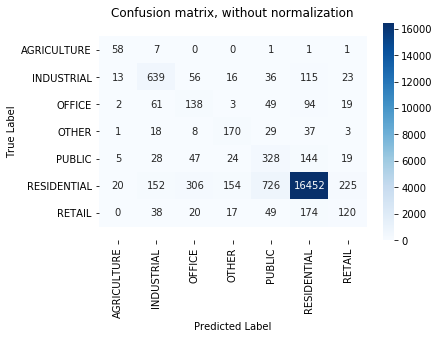

In [399]:
conf_matrix(y_test,Y_pred_XG)

A continuación imprimimos por pantalla el informe de resultados. En él se pueden observar las métricas más relevantes del modelo.

In [383]:
# informe de resultados

print(classification_report(y_test,Y_pred_XG))

              precision    recall  f1-score   support

 AGRICULTURE       0.59      0.85      0.69        68
  INDUSTRIAL       0.68      0.71      0.69       898
      OFFICE       0.24      0.38      0.29       366
       OTHER       0.44      0.64      0.52       266
      PUBLIC       0.27      0.55      0.36       595
 RESIDENTIAL       0.97      0.91      0.94     18035
      RETAIL       0.29      0.29      0.29       418

    accuracy                           0.87     20646
   macro avg       0.50      0.62      0.54     20646
weighted avg       0.90      0.87      0.88     20646



Vemos como el modelo tiene un buen rendimiento a excepción de las clases `OFFICE`, `PUBLIC` y `RETAIL`. Creemos que esto no se debe al desbalanceo, sino a que estas clases sufren de un solapamiento tal y como hemos visto en otras visualizaciones que hemos efectuado.

También observamos la importancia dada por el modelo a cada una de las variables del _dataset_ a la hora de realizar la predicción.

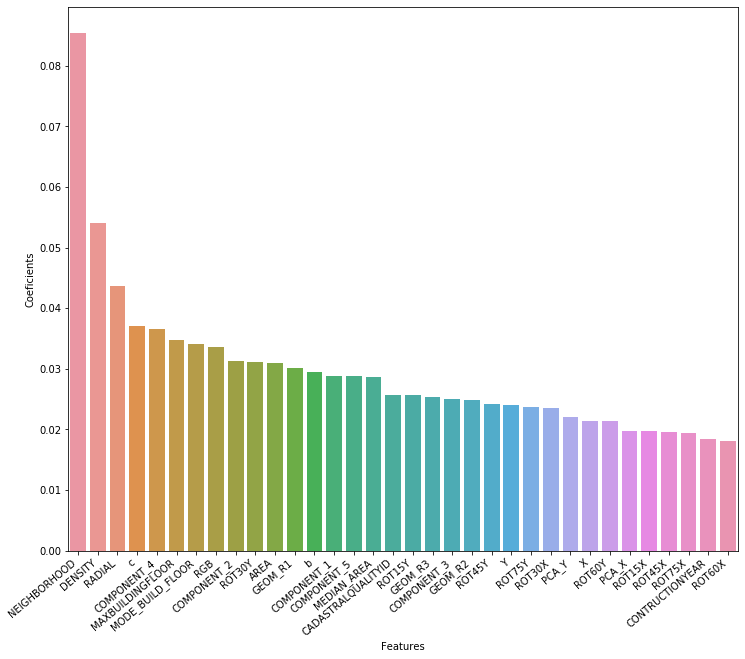

In [757]:
# importancia de las variables

features_importence(XGBoost.feature_importances_)

Uno de los requisitos imprescindibles que ha de cumplir un modelo es que sea robusto, es decir, ante la entrada de datos desconocidos este no ha de fallar en gran medida. Ponemos a prueba la robustez del modelo mediante un proceso de _cross validation_.

In [758]:
from imblearn.pipeline import Pipeline

In [759]:
pipeline2 = Pipeline([('sampling', SMOTETomek(random_state=42, n_jobs=-1)),
                     ('class', XGBoost)])

In [760]:
%%time
# cross validation con SMOTEtomek

accuracies = cross_val_score(estimator = pipeline2, X = X, y = Y, cv = 4, scoring=my_score)
CrossValMean = accuracies.mean()

print("CrossValMean:", CrossValMean)

CrossValMean: 0.7289922626587526
Wall time: 1h 6min 36s


In [543]:
accuracies

array([0.73716342, 0.72501034, 0.72700148, 0.7278205 ])

In [761]:
accuracies

array([0.73549973, 0.72669646, 0.72589826, 0.7278746 ])

### PREDICCIÓN

Una vez generado un modelo, debemos procesar los datos de test antes de realizar una predicción.

Como nuestro modelo se hace también en base al test tenemos ue unir ambos dataframes para el calculo de variables.

In [790]:
data_path_test = '../data/Estimar_UH2020.txt'
test = pd.read_csv(data_path_test, sep = "|")

In [791]:
training = pd.read_csv(data_path_train, sep = "|")

In [792]:
training.drop('CLASE', axis=1, inplace=True)

In [793]:
joined = pd.concat([training, test], axis = 0, ignore_index=True)

In [794]:
joined['MAXBUILDINGFLOOR'].fillna(1, inplace=True)
joined['CADASTRALQUALITYID'].fillna('7', inplace=True)

Comprobamos que la imputación se ha realizado.

In [795]:
joined.CADASTRALQUALITYID.isnull().sum(), joined.MAXBUILDINGFLOOR.isnull().sum()

(0, 0)

In [796]:
# ordinal encoding de la variable CADASTRALQUALITYID

joined['CADASTRALQUALITYID'] = joined['CADASTRALQUALITYID'].apply(lambda x: ordinal(x))

In [797]:
# Genero la variable saturación mediana de la imagen

joined['RGB']= (joined['Q_R_4_0_5'] + joined['Q_G_3_0_5'] + joined['Q_B_2_0_5'] + joined['Q_NIR_8_0_5'])/4

In [798]:
channels = pca.transform(joined.loc[:, 'Q_R_4_0_0':'Q_NIR_8_1_0'])
channels = pd.DataFrame(channels, columns = [f'COMPONENT_{i+1}' for i in range(5)])

In [799]:
# eliminación de los canales de color y de GEOM_R4

joined.drop(['Q_R_4_0_0', 'Q_R_4_0_1', 'Q_R_4_0_2', 'Q_R_4_0_3',
       'Q_R_4_0_4', 'Q_R_4_0_5', 'Q_R_4_0_6', 'Q_R_4_0_7', 'Q_R_4_0_8',
       'Q_R_4_0_9', 'Q_R_4_1_0', 'Q_G_3_0_0', 'Q_G_3_0_1', 'Q_G_3_0_2',
       'Q_G_3_0_3', 'Q_G_3_0_4', 'Q_G_3_0_5', 'Q_G_3_0_6', 'Q_G_3_0_7',
       'Q_G_3_0_8', 'Q_G_3_0_9', 'Q_G_3_1_0', 'Q_B_2_0_0', 'Q_B_2_0_1',
       'Q_B_2_0_2', 'Q_B_2_0_3', 'Q_B_2_0_4', 'Q_B_2_0_5', 'Q_B_2_0_6',
       'Q_B_2_0_7', 'Q_B_2_0_8', 'Q_B_2_0_9', 'Q_B_2_1_0', 'Q_NIR_8_0_0',
       'Q_NIR_8_0_1', 'Q_NIR_8_0_2', 'Q_NIR_8_0_3', 'Q_NIR_8_0_4',
       'Q_NIR_8_0_5', 'Q_NIR_8_0_6', 'Q_NIR_8_0_7', 'Q_NIR_8_0_8',
       'Q_NIR_8_0_9', 'Q_NIR_8_1_0','GEOM_R4'],axis=1, inplace=True)

In [800]:
joined[['X','Y']]

,X,Y
0,2207357872,165920300
1,2189757160,165463267
2,2240147335,165690752
3,2227146459,165934099
4,2212350459,165681791
...,...,...
108843,2150225841,165784181
108844,2192030837,165800127
108845,2169540519,165519808
108846,2225905882,165629885


In [803]:
# estandarización de las coordenadas

xyscaler=preprocessing.StandardScaler() # llamada a función
xyscaler.fit(joined[["X","Y"]]) # estandarización 
joined[["X","Y"]]=xyscaler.transform(joined[["X","Y"]]) # transformación variables

In [804]:
joined.drop(['ID'],axis=1, inplace=True)

El primer paso es unir los dos dataframes y rellenar los valores ausentes

In [805]:
kdt = scipy.spatial.cKDTree(joined[['X','Y']]) 
k = 5 
dists, neighs = kdt.query(joined[['X','Y']], k+1)

In [806]:
avg_dists = np.mean(dists[:, 1:], axis=1)

In [807]:
joined["DENSITY"] = avg_dists

In [809]:
kdt = scipy.spatial.cKDTree(joined[['X','Y']]) 
k = 15
dists, neighs = kdt.query(joined[['X','Y']], k+1)

In [810]:
neighs

array([[     0,  42647,  60439, ...,  80638,  82079,  94554],
       [     1,  56212,  11119, ..., 100636,  46151,  89245],
       [     2,  76014,  55968, ...,  72153,   8000,  81156],
       ...,
       [108845,   2831,  84754, ...,  57896,  55773, 106457],
       [108846,  82482,  44300, ...,  87598,  46438,  48490],
       [108847,  65271,  89980, ...,  54548,  85617,  58398]])

In [811]:
# Nos quedamos con los índices de los vecinos

neighs = neighs[:, 1:]

Guardo en una lista las modas de altura de los 15 vecinos. Como la moda puede ser mas de un valor, decido quedarme únicamente con la moda de menor altura.

In [812]:
mode_build_floor = []
for i in range(neighs.shape[0]):
    mode_build_floor.append(joined.loc[neighs[i], 'MAXBUILDINGFLOOR'].mode().values[0])

In [813]:
mode_build_floor = np.array(mode_build_floor)
joined['MODE_BUILD_FLOOR'] = mode_build_floor

Realizo el mismo procedimiento pero con la mediana del area de los 15 vecinos.

In [814]:
median_area = []
for i in range(neighs.shape[0]):
    median_area.append(joined.loc[neighs[i], 'AREA'].median())

In [815]:
median_area = np.array(median_area)
joined['MEDIAN_AREA'] = median_area

In [816]:
for degree in [15,30,45,60,75]:
    joined[f"ROT{degree}X"] = math.cos(math.radians(degree)) * joined["Y"] + math.sin(math.radians(degree)) * joined["X"] 
    joined[f"ROT{degree}Y"] = math.cos(math.radians(degree)) * joined["Y"] - math.sin(math.radians(degree)) * joined["X"]

In [817]:
joined["RADIAL"] = np.sqrt(np.power(joined["Y"], 2) + np.power(joined["X"], 2))

In [818]:
pca_obj = PCA().fit(joined[['X','Y']].values)
joined['PCA_X'] = pca_obj.transform(joined[['X', 'Y']])[:,0]
joined['PCA_Y'] = pca_obj.transform(joined[['X', 'Y']])[:,1]

In [819]:
# junto las variables PCA de los colores con el resto de variables (entre las que se incluyen las rotadas)

joined = pd.concat([channels, joined], axis = 1)

In [820]:
joined

,COMPONENT_1,COMPONENT_2,COMPONENT_3,COMPONENT_4,COMPONENT_5,X,Y,AREA,GEOM_R1,GEOM_R2,GEOM_R3,CONTRUCTIONYEAR,MAXBUILDINGFLOOR,CADASTRALQUALITYID,RGB,DENSITY,MODE_BUILD_FLOOR,MEDIAN_AREA,ROT15X,ROT15Y,ROT30X,ROT30Y,ROT45X,ROT45Y,ROT60X,ROT60Y,ROT75X,ROT75Y,RADIAL,PCA_X,PCA_Y
0,2014.093467,-1822.742583,-2310.110626,945.421189,133.912039,-0.054846,1.593370,144.426900,0.557237,0.067249,0.057372,2002,0.0,4,1116.501160,0.005444,1.0,161.648783,1.524882,1.553272,1.352475,1.407322,1.087900,1.165465,0.749187,0.844183,0.359417,0.465372,1.594313,1.087900,1.165465
1,-2066.257214,1133.747506,-807.334422,162.489469,-742.562297,-0.691909,-0.644588,38.342550,0.709884,0.125156,0.147929,1949,1.0,10,1045.997650,0.002144,1.0,62.760918,-0.801704,-0.443545,-0.904185,-0.212275,-0.945047,0.033461,-0.921505,0.276917,-0.835165,0.501501,0.945639,-0.945047,0.033461
2,-3033.476027,-647.635957,-747.201783,419.061020,-252.922375,1.131978,0.469340,108.794384,0.517702,0.058268,0.081666,1986,1.0,7,990.997551,0.004066,1.0,100.366000,0.746325,0.160370,0.972449,-0.159529,1.132303,-0.468556,1.214992,-0.745652,1.214881,-0.971933,1.225420,1.132303,-0.468556
3,-3211.481012,-736.550234,206.816613,1087.360645,-686.592346,0.661408,1.660939,155.224455,0.450871,0.053591,0.054201,1999,1.0,4,939.746941,0.005729,1.0,106.198000,1.775529,1.433159,1.769119,1.107712,1.642147,0.706776,1.403265,0.257674,1.068753,-0.208988,1.787786,1.642147,0.706776
4,-261.545289,-145.294444,508.277128,-1050.579489,280.508252,0.125862,0.425460,1789.873366,0.458819,0.012858,0.019936,1966,8.0,8,872.998039,0.011546,8.0,264.419904,0.443538,0.378388,0.431390,0.305528,0.389844,0.211848,0.321730,0.103730,0.231690,-0.011456,0.443686,0.389844,0.211848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108843,-5753.175854,-1208.206637,1027.937958,386.996216,-1478.181545,-2.122757,0.926834,92.647868,0.145280,0.040899,0.038341,1971,1.0,7,768.249638,0.007197,1.0,176.737653,0.345843,1.444663,-0.258717,1.864041,-0.845645,2.156387,-1.374945,2.301779,-1.810544,2.290309,2.316273,-0.845645,2.156387
108844,-2169.060601,194.409601,26.431794,-606.924492,123.116930,-0.609613,1.004917,152.576523,0.533303,0.030339,0.115207,1945,1.0,7,950.625763,0.005246,1.0,97.290055,0.812896,1.128455,0.565477,1.175090,0.279522,1.141645,-0.025482,1.030399,-0.328749,0.848933,1.175367,0.279522,1.141645
108845,3172.054684,3469.705221,7060.731183,1789.650415,-1496.147977,-1.423657,-0.367724,97.198486,0.550830,0.064267,0.088180,1999,1.0,6,874.999168,0.003681,1.0,99.090015,-0.723663,0.013276,-1.030286,0.393370,-1.266697,0.746658,-1.416785,1.049061,-1.470321,1.279973,1.470381,-1.266697,0.746658
108846,-3726.814372,-308.696307,251.715825,-960.235496,508.503469,0.616505,0.171292,154.021555,0.486815,0.052910,0.059737,1964,4.0,8,909.251205,0.003284,6.0,152.587600,0.325018,0.005892,0.456595,-0.159909,0.557056,-0.314813,0.619554,-0.448263,0.639831,-0.551164,0.639858,0.557056,-0.314813


In [822]:
%%time
db2 = DBSCAN(eps=epsilon, min_samples=8, algorithm= 'ball_tree', metric= 'haversine').fit(np.radians(joined[['X','Y']]))

Wall time: 14.7 s


In [823]:
len(np.unique(db2.labels_))

194

In [826]:
joined['NEIGHBORHOOD'] = db2.labels_

In [827]:
X_TRAIN = joined.iloc[:103230]

In [828]:
X_TEST = joined.loc[103230:]

In [831]:
%%time
X_resampled, y_resampled = SMOTETomek(random_state=42,
                                      n_jobs=-1).fit_resample(X_TRAIN, Y)

Wall time: 24.8 s


In [832]:
# mejor modelo con hyperparametros optimizados metrica nueva y SMOTETomek (optimización bayesiana)

XGBoost_final = xgb.XGBClassifier(colsample_bylevel=0.416, colsample_bytree=0.7304,
                               gamma=0, learning_rate=0.00886, max_delta_step=14,
                               max_depth=21, min_child_weight=4, n_estimators=235,
                               subsample=0.3114, random_state=0)

In [833]:
%%time
# entrenamiento y predicción

XGBoost_final.fit(X_resampled, y_resampled)

Wall time: 1h 36min 57s


XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=0.416,
              colsample_bynode=1, colsample_bytree=0.7304, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.00886, max_delta_step=14, max_depth=21,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              n_estimators=235, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=0.3114,
              tree_method=None, validate_parameters=False, verbosity=None)

In [186]:
prediccion = XGBoost_final.predict(X_TEST)

In [188]:
data_path = '../data/Estimar_UH2020.txt'

test = pd.read_csv(data_path, sep = "|")

In [189]:
test

,ID,X,Y,Q_R_4_0_0,Q_R_4_0_1,Q_R_4_0_2,Q_R_4_0_3,Q_R_4_0_4,Q_R_4_0_5,Q_R_4_0_6,Q_R_4_0_7,Q_R_4_0_8,Q_R_4_0_9,Q_R_4_1_0,Q_G_3_0_0,Q_G_3_0_1,Q_G_3_0_2,Q_G_3_0_3,Q_G_3_0_4,Q_G_3_0_5,Q_G_3_0_6,Q_G_3_0_7,Q_G_3_0_8,Q_G_3_0_9,Q_G_3_1_0,Q_B_2_0_0,Q_B_2_0_1,Q_B_2_0_2,Q_B_2_0_3,Q_B_2_0_4,Q_B_2_0_5,Q_B_2_0_6,Q_B_2_0_7,Q_B_2_0_8,Q_B_2_0_9,Q_B_2_1_0,Q_NIR_8_0_0,Q_NIR_8_0_1,Q_NIR_8_0_2,Q_NIR_8_0_3,Q_NIR_8_0_4,Q_NIR_8_0_5,Q_NIR_8_0_6,Q_NIR_8_0_7,Q_NIR_8_0_8,Q_NIR_8_0_9,Q_NIR_8_1_0,AREA,GEOM_R1,GEOM_R2,GEOM_R3,GEOM_R4,CONTRUCTIONYEAR,MAXBUILDINGFLOOR,CADASTRALQUALITYID
0,44198C2A811A4DF4,2200905624,165480229,1.105847e-06,445.999637,634.001172,780.000568,902.004053,1025.997009,1157.997681,1304.999585,1501.002661,1830.998926,7098.504905,0.000002,383.999710,528.000317,633.998871,724.998218,811.000366,901.999060,1010.996002,1162.000439,1438.003833,6630.661924,147.000473,461.000000,493.000122,522.999878,550.000061,575.999939,604.999817,647.000122,707.000122,825.000891,2962.301546,1.063087e-05,631.998126,889.002136,1084.999243,1259.988721,1432.501221,1619.998560,1835.995764,2120.993359,2545.997754,6803.875107,283.593030,0.046741,0.014588,0.011298,0.774503,1994,5.0,4
1,216F638609E0E39E,2207436564,165625751,0.000000e+00,385.000995,580.005762,737.004449,873.996460,1005.998779,1141.001758,1296.997083,1505.996753,1822.994031,5364.803157,0.000000,346.996735,495.997705,602.000580,701.000647,795.999268,889.995288,995.997449,1138.001709,1387.002820,5534.496367,99.000961,483.999969,521.000342,547.000183,570.000061,591.999878,615.798437,643.000183,682.000122,754.700116,2182.966982,7.401012e-12,558.004102,809.008313,1002.009210,1175.000195,1327.996887,1486.795728,1666.104956,1884.994067,2220.990137,5544.670485,357.712450,0.378483,0.041085,0.025753,0.626835,1968,8.0,3
2,FFFCEFB11E257364,2200313961,165752898,0.000000e+00,343.996613,567.010620,745.995483,900.997925,1051.995361,1200.006226,1370.990234,1590.001099,1905.991516,7074.674140,0.000000,291.003632,458.000061,579.999023,685.998840,780.000336,878.996094,992.996582,1149.010254,1425.496948,8340.301104,214.000305,472.000015,508.000153,539.000061,567.999878,591.000000,614.999695,638.999847,670.999939,722.999695,1542.247090,0.000000e+00,489.004868,776.002319,992.004883,1186.992432,1364.991089,1551.001343,1759.008057,2022.004272,2421.002441,8827.104856,160.979017,0.306545,0.034637,0.054977,1.587207,1968,5.0,7
3,596C5C8CE10BCF,2199220382,166288192,0.000000e+00,173.999956,218.000000,261.999713,315.999951,408.000565,560.000500,700.697351,863.000671,1200.897534,7689.470151,0.000006,251.000169,291.999847,328.000739,369.998914,434.998367,545.000671,664.699524,792.998560,1068.003235,7690.967231,3.000620,130.999969,151.000061,175.999939,206.000137,242.000015,318.000031,367.999969,457.000299,691.000049,1713.185116,5.006439e+00,1307.006531,1527.999072,1675.999512,1798.999854,1924.994751,2054.998730,2212.999951,2422.002002,2752.005786,7734.759269,9088.678448,0.338955,0.006846,0.005448,0.795725,1993,6.0,6
4,F931B9FA2A8641D1,2209143550,165253334,6.931730e-06,588.002014,738.999451,848.001282,954.000244,1074.000183,1228.998291,1416.999817,1639.999268,1937.999329,7535.480762,0.000013,513.999084,645.999207,739.015839,831.997925,931.005920,1050.008301,1203.999451,1395.999023,1677.999146,7280.822226,47.000126,398.000137,462.999939,512.006744,571.000061,633.000397,706.000061,796.000000,910.001160,1102.999512,2955.738621,2.748954e-04,1103.002808,1350.003296,1535.006531,1692.002075,1839.000488,1996.000000,2159.998657,2366.000000,2712.997681,7435.991490,994.424368,0.581476,0.036470,0.016033,0.439638,1964,4.0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5613,EEDC412322324F11,2150225841,165784181,2.970924e-11,244.000557,308.999573,358.000412,404.001129,452.999222,505.999176,574.000275,677.005371,858.498199,4256.228459,0.000010,300.000000,348.999664,385.999756,4

In [190]:
ID = test.pop('ID')

In [191]:
ID = ID.to_frame()

Incluimos la predicción en el dataframe y lo guardamos

In [192]:
ID['CLASE']= prediccion

In [193]:
ID.groupby('CLASE').count()

,ID
CLASE,
AGRICULTURE,135
INDUSTRIAL,938
OFFICE,446
OTHER,304
PUBLIC,648
RESIDENTIAL,2857
RETAIL,290


In [144]:
ID.groupby('CLASE').count()

,ID
CLASE,
AGRICULTURE,90
INDUSTRIAL,859
OFFICE,178
OTHER,184
PUBLIC,284
RESIDENTIAL,3871
RETAIL,152


 AGRICULTURE       0.73      0.68      0.70        77
  INDUSTRIAL       0.75      0.65      0.70       876
      OFFICE       0.53      0.19      0.28       377
       OTHER       0.77      0.44      0.56       275
      PUBLIC       0.56      0.26      0.35       605
 RESIDENTIAL       0.94      0.99      0.96     18047
      RETAIL       0.68      0.22      0.33       389

In [150]:
(90*0.73/0.68)*0.85

82.12499999999999

In [151]:
862* 0.75/0.65*0.85

845.4230769230768

In [152]:
180 * 0.53/0.19*0.85

426.7894736842105

In [153]:
188 * 0.77/0.44*0.85

279.65

In [154]:
278 * 0.56 /0.26*0.85

508.9538461538462

In [155]:
158 * 0.68/0.22*0.85

415.109090909091

In [156]:
(90*0.73/0.68 +862* 0.75/0.65+180 * 0.53/0.19+188 * 0.77/0.44+278 * 0.56 /0.26 +158 * 0.68/0.22)*0.85

2558.050487670225

In [157]:
(3862 * 0.94 /0.99)*0.85

3116.9070707070705

In [ ]:
# los porcentaje en test de las clases minoritarias parecen ser entre 4 y 5 veces mayores al training

In [ ]:
# Darle pesos a cada categoría en la métrica en función de su peso relativo en el accuracy del test (recall weighted)

In [194]:
ID.to_csv('../data/_MATRICS2.txt', sep='|', index=False)

### BIBLIOGRAFÍA Y OTRAS FUENTES CONSULTADAS

#### RECURSOS WEB

* __Título:__ Feature engineering: all I learnt about Geo-spatial features. __Autor:__ Bala Manikandan. __Enlace:__  https://medium.com/@maney020/feature-engineering-all-i-learned-about-geo-spatial-features-649871d16796

#### LIBROS

* __Título:__ Feature Engineering for Machine Learning, Principles and Techniques for Data Scientists. __Autores:__ Alice Zheng & Amanda Casari. __Editorial:__ O'Reilly Media